# Is world a better place than we think?

# Data loading and cleaning



In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [8]:
df = pd.read_csv('wdi.csv')

In [9]:
df.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
0,Arab World,ARB,"2005 PPP conversion factor, GDP (LCU per inter...",PA.NUS.PPP.05,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"2005 PPP conversion factor, private consumptio...",PA.NUS.PRVT.PP.05,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,Access to clean fuels and technologies for coo...,EG.CFT.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,81.844982,82.407647,82.827636,83.169227,83.587141,83.954293,84.230630,84.570425,NaN,NaN
3,Arab World,ARB,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,85.189815,86.136134,86.782683,87.288244,88.389705,88.076774,88.517967,88.768654,NaN,NaN
4,Arab World,ARB,"Access to electricity, rural (% of rural popul...",EG.ELC.ACCS.RU.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,73.530494,74.543489,75.770972,76.772916,78.839139,77.487377,78.564439,78.958780,NaN,NaN


In [10]:
import seaborn as sns

In [11]:
cols = ['1960', '1961', '1962', '1963', '1964', '1965', '1966', '1967', '1968',
       '1969', '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977',
       '1978', '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986',
       '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995',
       '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004',
       '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013',
       '2014', '2015', '2016', '2017', '2018']

In [12]:
df = df.melt(id_vars= ['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code'],value_vars=cols,var_name = 'Year')

In [13]:
df = df.dropna()

In [14]:
df.columns

Index(['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code',
       'Year', 'value'],
      dtype='object')

In [15]:
df.head()

,Country Name,Country Code,Indicator Name,Indicator Code,Year,value
50,Arab World,ARB,"Adolescent fertility rate (births per 1,000 wo...",SP.ADO.TFRT,1960,134.223612
56,Arab World,ARB,Age dependency ratio (% of working-age populat...,SP.POP.DPND,1960,88.205810
57,Arab World,ARB,"Age dependency ratio, old (% of working-age po...",SP.POP.DPND.OL,1960,6.602746
58,Arab World,ARB,"Age dependency ratio, young (% of working-age ...",SP.POP.DPND.YG,1960,81.465388
90,Arab World,ARB,Aquaculture production (metric tons),ER.FSH.AQUA.MT,1960,4600.000000


In [16]:
df.isna().sum()

Country Name      0
Country Code      0
Indicator Name    0
Indicator Code    0
Year              0
value             0
dtype: int64

In [17]:
df2 = df.pivot_table(index=['Country Name','Year'],columns='Indicator Code', values='value')

In [18]:
df2 = pd.DataFrame(df2.to_records())

In [19]:
df2.columns

Index(['Country Name', 'Year', 'AG.AGR.TRAC.NO', 'AG.CON.FERT.PT.ZS',
       'AG.CON.FERT.ZS', 'AG.LND.AGRI.K2', 'AG.LND.AGRI.ZS', 'AG.LND.ARBL.HA',
       'AG.LND.ARBL.HA.PC', 'AG.LND.ARBL.ZS',
       ...
       'per_sa_allsa.cov_q4_tot', 'per_sa_allsa.cov_q5_tot',
       'per_si_allsi.adq_pop_tot', 'per_si_allsi.ben_q1_tot',
       'per_si_allsi.cov_pop_tot', 'per_si_allsi.cov_q1_tot',
       'per_si_allsi.cov_q2_tot', 'per_si_allsi.cov_q3_tot',
       'per_si_allsi.cov_q4_tot', 'per_si_allsi.cov_q5_tot'],
      dtype='object', length=1596)

In [20]:
df_c = pd.read_csv("country.csv")

In [21]:
df_c.head()

,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,...,System of trade,Government Accounting concept,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data
0,ABW,Aruba,Aruba,Aruba,AW,Aruban florin,Central Bureau of Statistics and Central Bank ...,Latin America & Caribbean,High income,AW,...,General trade system,NaN,Enhanced General Data Dissemination System (e-...,2010,NaN,NaN,Yes,NaN,NaN,2016.0
1,AFG,Afghanistan,Afghanistan,Islamic State of Afghanistan,AF,Afghan afghani,Central Statistics Organization; World Bank st...,South Asia,Low income,AF,...,General trade system,Consolidated central government,Enhanced General Data Dissemination System (e-...,1979,"Demographic and Health Survey, 2015","Integrated household survey (IHS), 2016/17",NaN,NaN,NaN,2017.0
2,AGO,Angola,Angola,People's Republic of Angola,AO,Angolan kwanza,IMF ; Source of population estimates: UN Popul...,Sub-Saharan Africa,Lower middle income,AO,...,Special trade system,Budgetary central government,Enhanced General Data Dissemination System (e-...,2014,"Demographic and Health Survey, 2015/16","Integrated household survey (IHS), 2008/09",NaN,NaN,NaN,2017.0
3,ALB,Albania,Albania,Republic of Albania,AL,Albanian lek,Albanian Institute of Statistics ; Source of p...,Europe & Central Asia,Upper middle income,AL,...,Special trade system,Consolidated central government,Enhanced General Data Dissemination System (e-...,2011,"Demographic and Health Survey, 2017/18",Living Standards Measurement Study Survey (LSM...,Yes,2012,2013.0,2017.0
4,AND,Andorra,Andorra,Principality of Andorra,AD,Euro,"Government of Andorra, Department of Statistic...",Europe & Central Asia,High income,AD,...,General trade system,NaN,NaN,2011. Population data compiled from administra...,NaN,NaN,Yes,NaN,NaN,NaN


In [22]:
df_c.columns

Index(['Country Code', 'Short Name', 'Table Name', 'Long Name', '2-alpha code',
       'Currency Unit', 'Special Notes', 'Region', 'Income Group', 'WB-2 code',
       'National accounts base year', 'National accounts reference year',
       'SNA price valuation', 'Lending category', 'Other groups',
       'System of National Accounts', 'Alternative conversion factor',
       'PPP survey year', 'Balance of Payments Manual in use',
       'External debt Reporting status', 'System of trade',
       'Government Accounting concept', 'IMF data dissemination standard',
       'Latest population census', 'Latest household survey',
       'Source of most recent Income and expenditure data',
       'Vital registration complete', 'Latest agricultural census',
       'Latest industrial data', 'Latest trade data'],
      dtype='object')

# Defining groups

In [231]:
country1 = ["East Asia & Pacific","Europe & Central Asia","European Union","Latin America & Caribbean","Middle East & North Africa","North America","South Asia",
            "World","Sub-Saharan Africa","South Africa","Central African Republic"]
country2 = ["Low income","Lower middle income","Upper middle income","High income"]

country3 = ["Afghanistan","Australia","Bangladesh","Brazil","China","Germany","United Kingdom","India","Japan",
            "Philippines","Saudi Arabia","Sweden","United States"]

In [24]:
df2.shape

(15517, 1596)

In [25]:
df2 = pd.merge(df2,df_c[['Table Name','Income Group','Region']],left_on='Country Name',right_on='Table Name',how = 'left')

In [26]:
df2.shape

(15517, 1599)

In [27]:
df2['Year'].max()

'2018'

In [28]:
df3 = df2[df2['Country Name'].isin(country1)]

In [1]:
import plotly as py

In [29]:
import plotly.express as px

In [4]:
import cufflinks as cf

We check the colorscales available in cufflinks. The closest match to 'viridis' in cufflinks is 'ylgnbu'. We will try to use that wherever required. For general purpose we will use 'plotly' as it offers many color options.

In [5]:
cf.colors.scales()

In [30]:
cf.set_config_file(offline=True, world_readable=True,theme = 'solar',colorscale='plotly')

<H2> Literacy Rate</H2>
Let's first explore the how many girls complete primary education in the world accross income levels

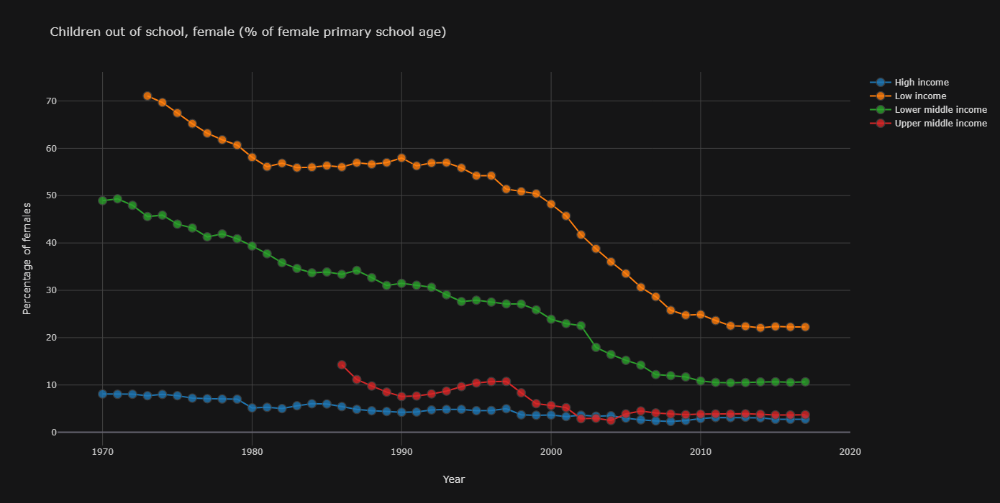

In [31]:
td = df2[df2['Country Name'].isin(country2)]
td = td[td["SE.PRM.UNER.FE.ZS"].notna()]
td.iplot(kind = 'scatter',x= 'Year',y='SE.PRM.UNER.FE.ZS',text='Country Name', yTitle = "Percentage of females", mode = "markers+lines"
             ,xTitle='Year', title='Children out of school, female (% of female primary school age)',categories = 'Country Name', dimensions = [1350,700])

Let's look at it in another way

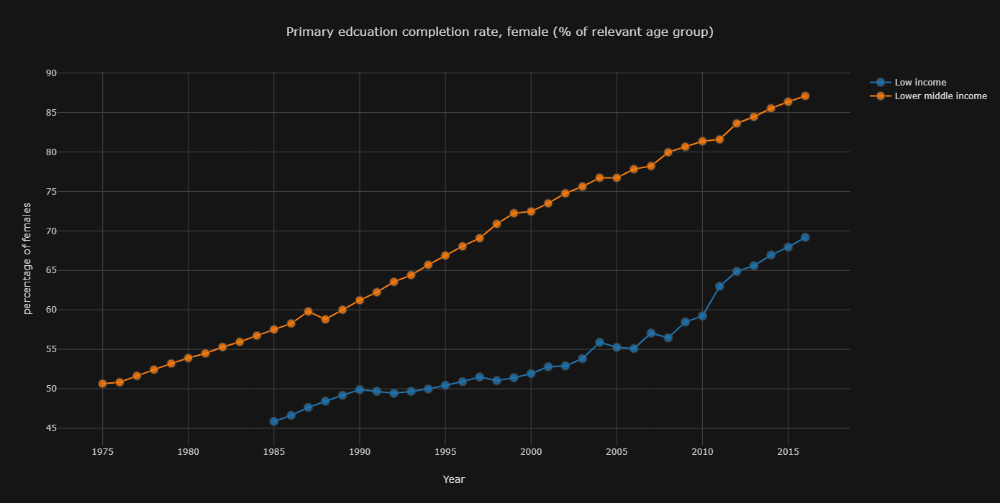

In [26]:
td = df2[df2['Country Name'].isin(["Low income","Lower middle income"])]
variable = "SE.ADT.1524.LT.FE.ZS"
td = td[td[variable].notna()]
td.iplot(kind = 'scatter',x= 'Year',y=variable,text='Country Name', yTitle = "percentage of females", mode = "markers+lines"
             ,xTitle='Year', title='Primary edcuation completion rate, female (% of relevant age group)',categories = 'Country Name', dimensions = [1350,700])

So even in the low income countries the rate has improved to 70%, which is very good.

<H2> Mortality Rate</H2>
Let's now explore the mortality rate across the world. I have decided to use the groupings by the world bank exploring all possible regions instead of looking at each country.

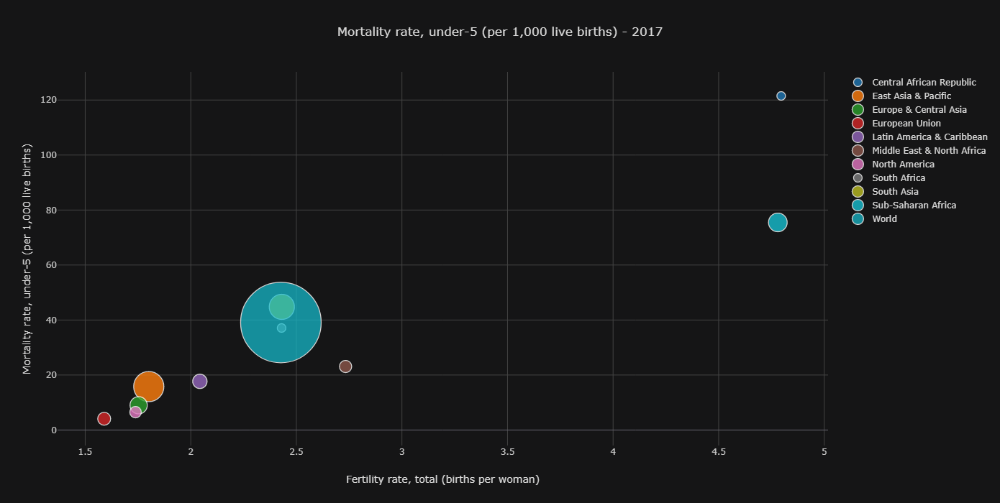

In [39]:
df3[df3['Year']=='2017'].iplot(kind = 'bubble',x= 'SP.DYN.TFRT.IN',y='SH.DYN.MORT',size = 'SP.POP.TOTL',text='Country Name', colorscale = 'plotly'
             ,xTitle='Fertility rate, total (births per woman)', yTitle='Mortality rate, under-5 (per 1,000 live births)',categories = 'Country Name', dimensions = [1350,700]
                                , title = "Mortality rate, under-5 (per 1,000 live births) - 2017")

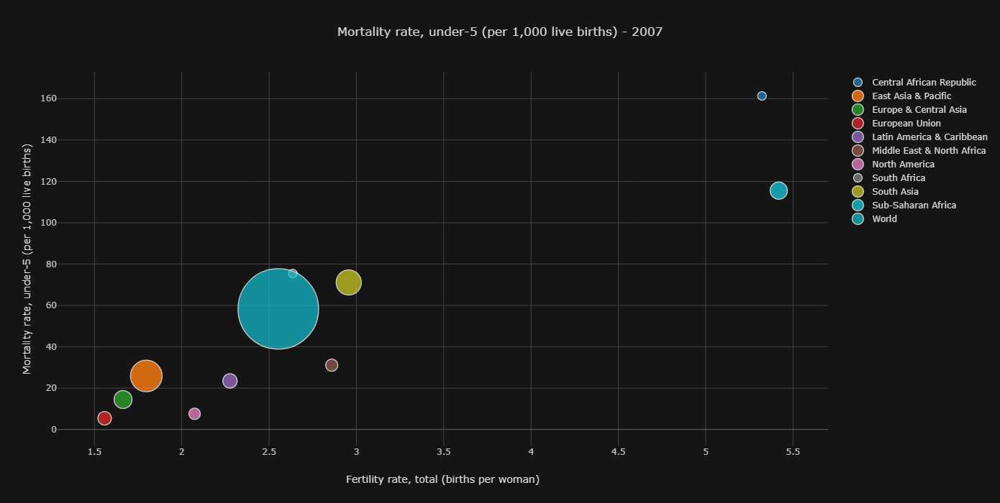

In [34]:
df3[df3['Year']=='2007'].iplot(kind = 'bubble',x= 'SP.DYN.TFRT.IN',y='SH.DYN.MORT',size = 'SP.POP.TOTL',text='Country Name', colorscale = 'plotly'
             ,xTitle='Fertility rate, total (births per woman)', yTitle='Mortality rate, under-5 (per 1,000 live births)',categories = 'Country Name', dimensions = [1350,700]
              , title = "Mortality rate, under-5 (per 1,000 live births) - 2007")

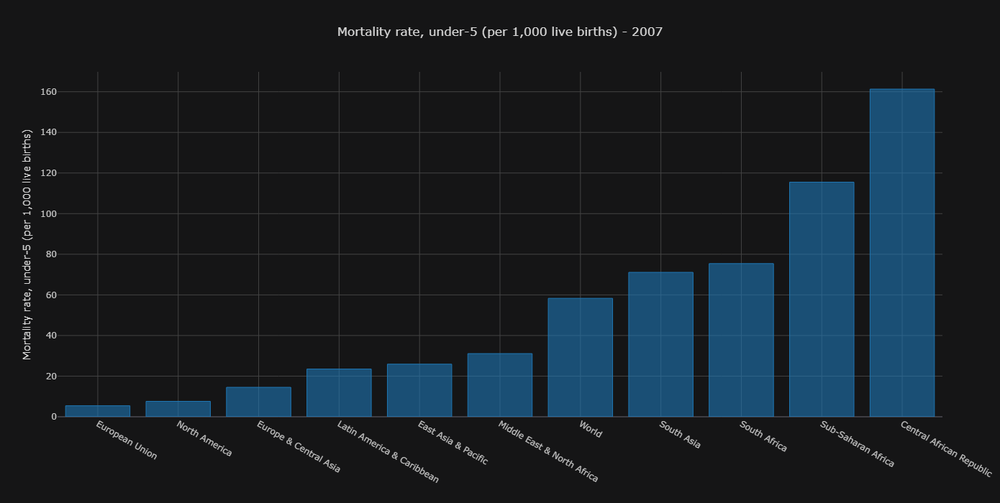

In [63]:
td = df3[["Country Name","Year","SH.DYN.MORT"]]
td = td.sort_values("SH.DYN.MORT")
td[td['Year']=='2007'].iplot(kind = 'bar',x= 'Country Name',y='SH.DYN.MORT'
             , yTitle='Mortality rate, under-5 (per 1,000 live births)', dimensions = [1350,700], margin = {"b":120}
              , title = "Mortality rate, under-5 (per 1,000 live births) - 2007")

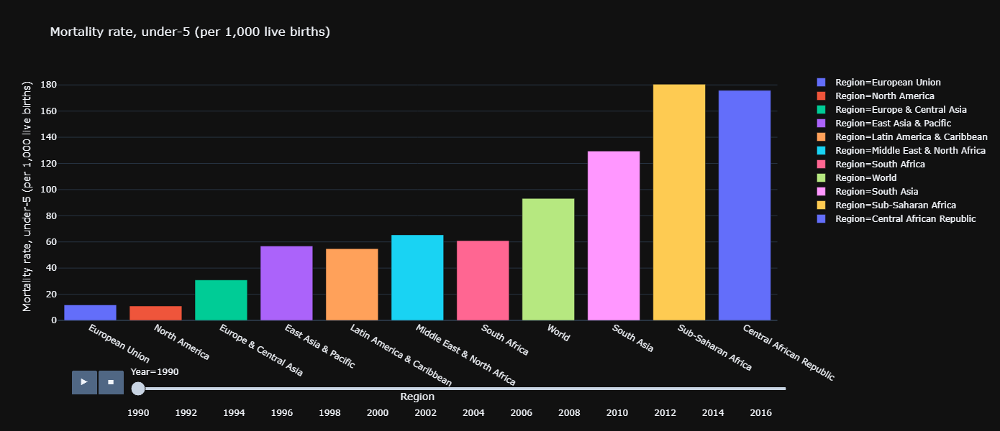

In [99]:
td = df3[["Country Name","Year","SH.DYN.MORT"]]
td = td.sort_values("SH.DYN.MORT")
td = td.sort_values("Year")
td = td.query("Year>='1990' and Year<'2018'")

px.bar(td,x= 'Country Name',y='SH.DYN.MORT', color = "Country Name",animation_frame="Year",labels={"Country Name": "Region",'SH.DYN.MORT':"Mortality rate, under-5 (per 1,000 live births)"} 
       ,template="plotly_dark" ,title='Mortality rate, under-5 (per 1,000 live births)'
       ,category_orders={"Country Name":["European Union","North America","Europe & Central Asia","East Asia & Pacific","Latin America & Caribbean",
                         "Middle East & North Africa","South Africa","World","South Asia","Sub-Saharan Africa","Central African Republic"]})

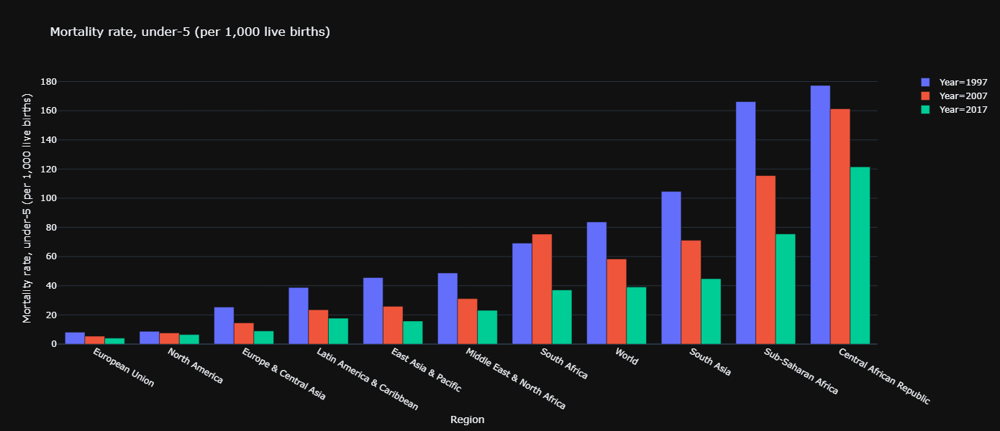

In [96]:
td = df2[df2['Country Name'].isin(country1)]
td = td[["Country Name","Year","SH.DYN.MORT"]]
td = td[td["Year"].isin(["1997","2007","2017"])]
td = td.sort_values(["Year","SH.DYN.MORT"])
px.bar(td,x= 'Country Name',y='SH.DYN.MORT', color = "Year",labels={"Country Name": "Region",'SH.DYN.MORT':"Mortality rate, under-5 (per 1,000 live births)"}, template="plotly_dark"
       ,title='Mortality rate, under-5 (per 1,000 live births)',barmode="group")

This plot is good for reporting purpose where one can interactively identify the regions. But below is a another way to plot this using matplotlib where the name of the region is highlighted.

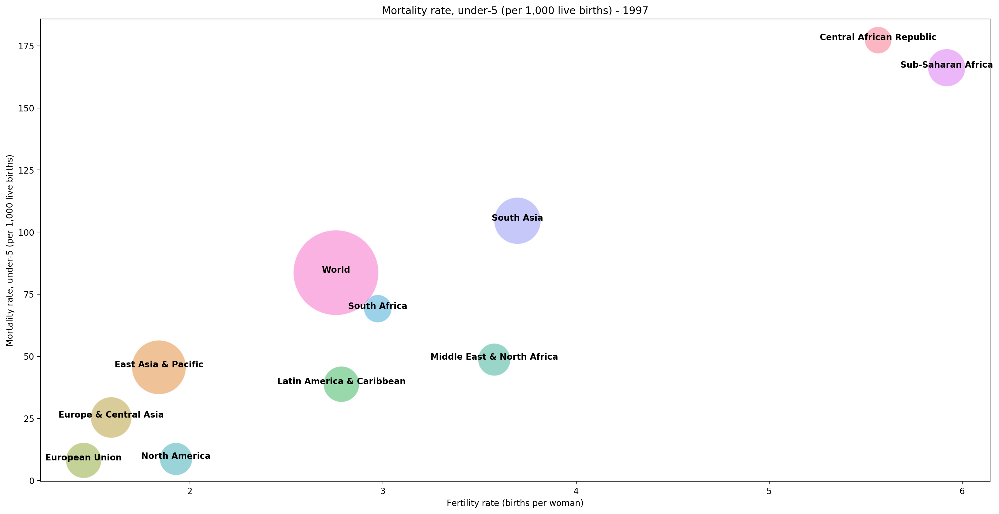

In [100]:
plt.figure(figsize=[20,10],dpi = 200)
td = df3[df3['Year']=='1997']
sz = td['SP.POP.TOTL']
ax = sns.scatterplot(data=td,x= 'SP.DYN.TFRT.IN',y='SH.DYN.MORT', size= sz,hue="Country Name",legend=False,sizes = (1000,10000),alpha=0.5)
plt.xlabel("Fertility rate (births per woman)")
plt.ylabel("Mortality rate, under-5 (per 1,000 live births)")
plt.title("Mortality rate, under-5 (per 1,000 live births) - 1997")
for line in range(0,td.shape[0]):
     ax.text(td['SP.DYN.TFRT.IN'].iloc[line], td['SH.DYN.MORT'].iloc[line], td['Country Name'].iloc[line], horizontalalignment='center', size='medium', color='black', weight='semibold')
plt.savefig("mort_1997.png")

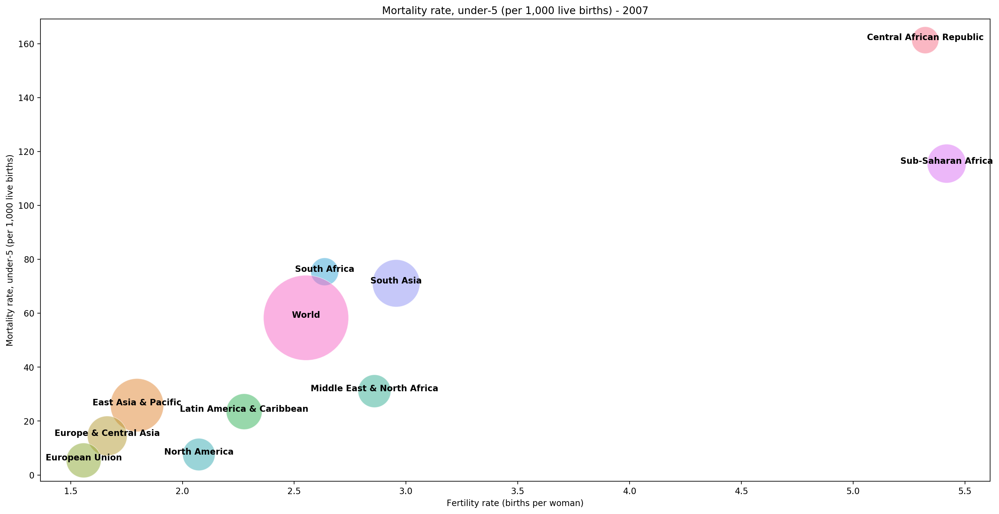

In [101]:
plt.figure(figsize=[20,10],dpi = 200)
td = df3[df3['Year']=='2007']
sz = td['SP.POP.TOTL']
ax = sns.scatterplot(data=td,x= 'SP.DYN.TFRT.IN',y='SH.DYN.MORT', size= sz,hue="Country Name",legend=False,sizes = (1000,10000),alpha=0.5)
plt.xlabel("Fertility rate (births per woman)")
plt.ylabel("Mortality rate, under-5 (per 1,000 live births)")
plt.title("Mortality rate, under-5 (per 1,000 live births) - 2007")
for line in range(0,td.shape[0]):
     ax.text(td['SP.DYN.TFRT.IN'].iloc[line], td['SH.DYN.MORT'].iloc[line], td['Country Name'].iloc[line], horizontalalignment='center', size='medium', color='black', weight='semibold')
plt.savefig("mort_2007.png")

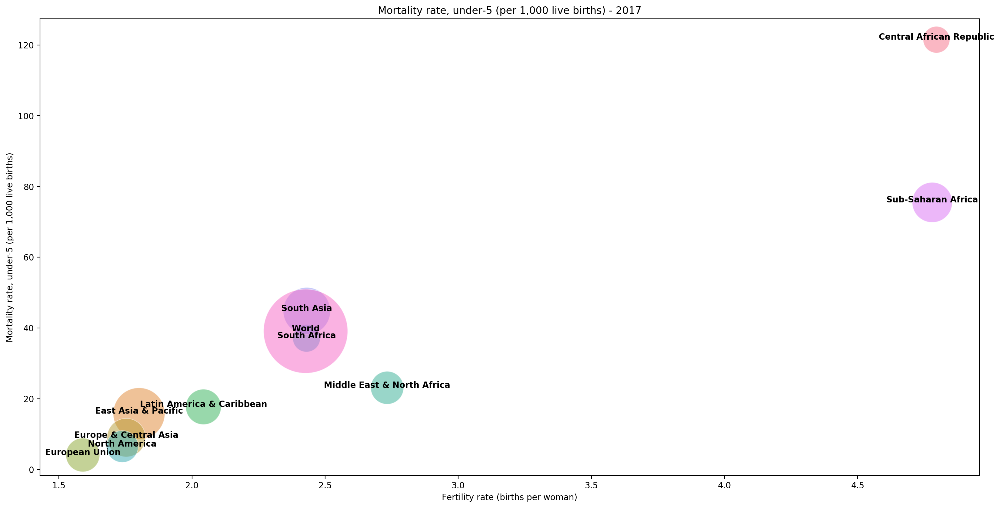

In [102]:
plt.figure(figsize=[20,10],dpi = 200)
td = df3[df3['Year']=='2017']
sz = td['SP.POP.TOTL']
ax = sns.scatterplot(data=td,x= 'SP.DYN.TFRT.IN',y='SH.DYN.MORT', size= sz,hue="Country Name",legend=False,sizes = (1000,10000),alpha=0.5)
plt.xlabel("Fertility rate (births per woman)")
plt.ylabel("Mortality rate, under-5 (per 1,000 live births)")
plt.title("Mortality rate, under-5 (per 1,000 live births) - 2017")
for line in range(0,td.shape[0]):
     ax.text(td['SP.DYN.TFRT.IN'].iloc[line], td['SH.DYN.MORT'].iloc[line], td['Country Name'].iloc[line], horizontalalignment='center', size='medium', color='black', weight='semibold')
plt.savefig("mort_2017.png")

This looks nice.

<h4>Now looking at the same across the years</h4>

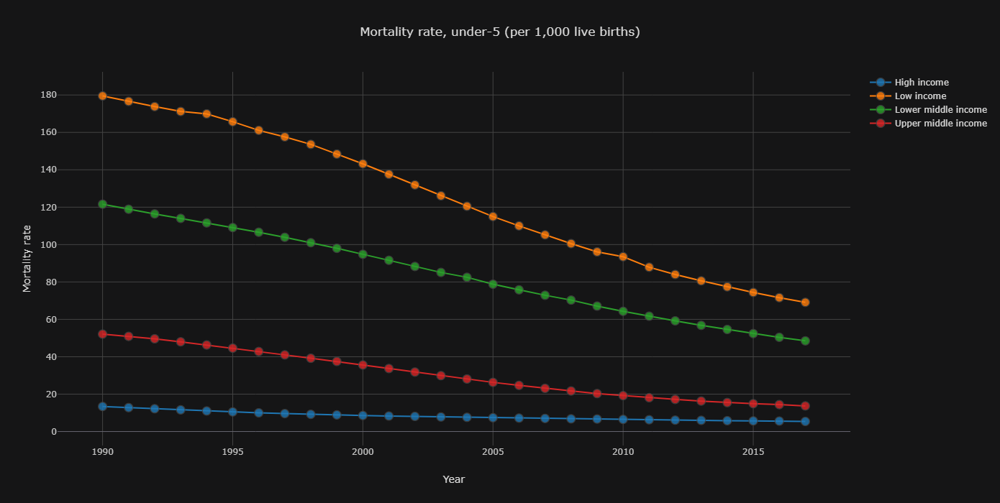

In [89]:
td = df2[df2['Country Name'].isin(country2)]
variable = "SH.DYN.MORT"
td = td[td[variable].notna()]
td.iplot(kind = 'scatter',x= 'Year',y=variable,text='Country Name', yTitle = "Mortality rate", mode = "markers+lines"
             ,xTitle='Year', title='Mortality rate, under-5 (per 1,000 live births)',categories = 'Country Name', dimensions = [1350,700])

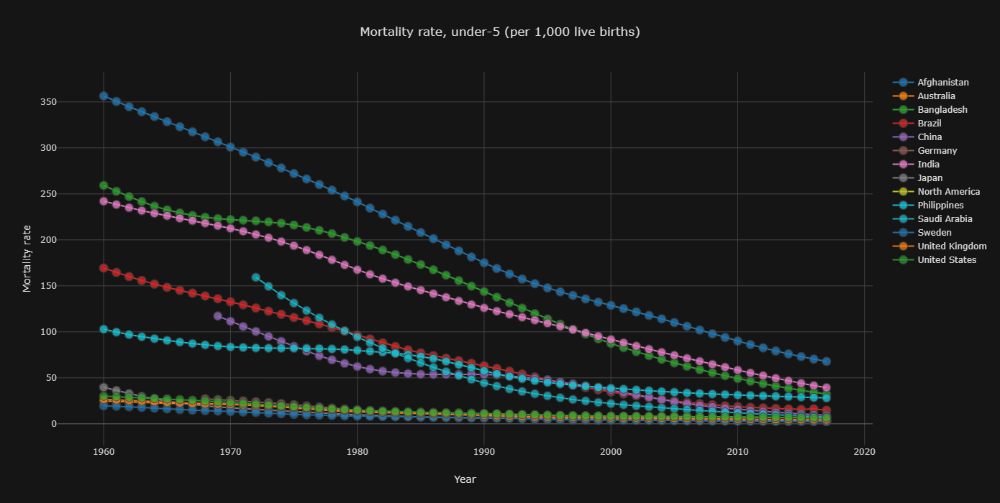

In [92]:
td = df2[df2['Country Name'].isin(country3)]
variable = "SH.DYN.MORT"
td = td[td[variable].notna()]
td.iplot(kind = 'scatter',x= 'Year',y=variable,text='Country Name', yTitle = "Mortality rate", mode = "markers+lines"
             ,xTitle='Year', title='Mortality rate, under-5 (per 1,000 live births)',categories = 'Country Name', dimensions = [1350,700])

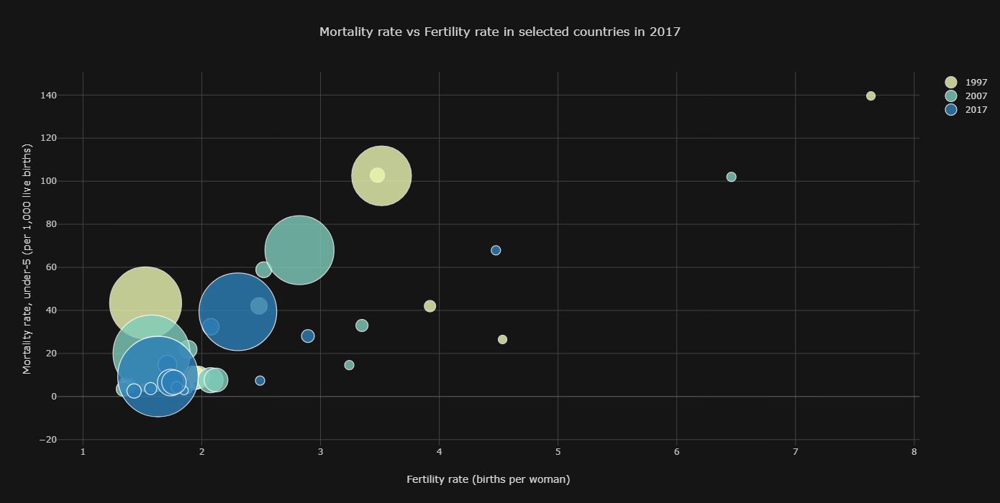

In [53]:
td = df2[df2['Country Name'].isin(country3)]
td[td['Year'].isin(['1997','2007','2017'])].iplot(kind = 'bubble',x= 'SP.DYN.TFRT.IN',y='SH.DYN.MORT',size = 'SP.POP.TOTL',text='Country Name'
             ,xTitle='Fertility rate (births per woman)', yTitle='Mortality rate, under-5 (per 1,000 live births)',filename='cufflinks/simple-bubble-chart'
                                  , dimensions = [1350,700],categories = 'Year', title = "Mortality rate vs Fertility rate in selected countries in 2017")


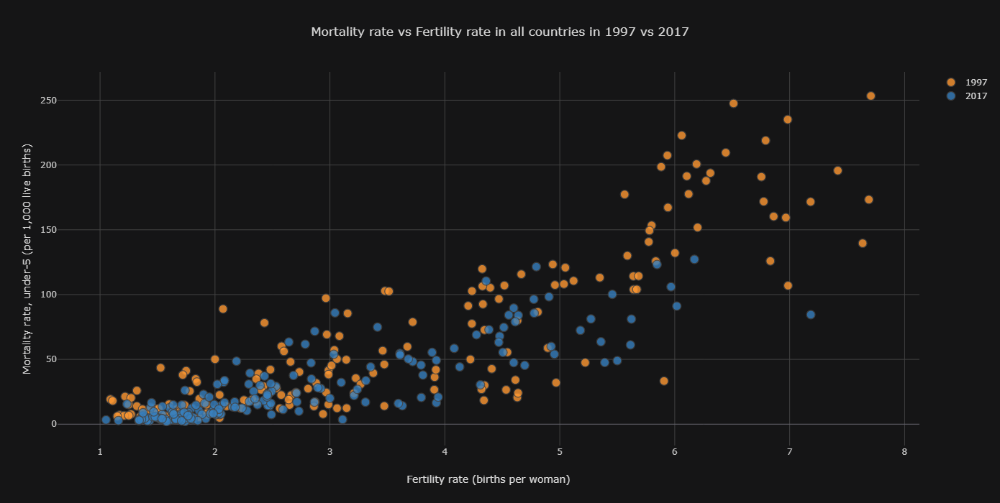

In [325]:
td = df2[df2['Income Group'].notna()]
td = td[td['SP.DYN.TFRT.IN'].notna()]
td = td[td['SH.DYN.MORT'].notna()]
td = td[td['SP.POP.TOTL'].notna()]
td[td['Year'].isin(['1997','2017'])].iplot(kind = 'scatter',x= 'SP.DYN.TFRT.IN',y='SH.DYN.MORT',text='Country Name',
             xTitle='Fertility rate (births per woman)', yTitle='Mortality rate, under-5 (per 1,000 live births)',filename='cufflinks/simple-bubble-chart'
                                  , dimensions = [1350,700],categories = 'Year', title = "Mortality rate vs Fertility rate in all countries in 1997 vs 2017")


All the above plots show that there has been tremendous improvement in mortality rate of children below 5 years. Hence, now less children (below age 5) die each year across the globe. This is the result of improvement in health care facilities and availability of nutritional food. This also shows that not many people are living under extreme poverty now against the general perception. This is what we are going to explore more in the next section.

<h2> Developed and Developing?</h2>
When we divide the world demographics based on the income of people or economic condition, we always have only two distinctions in mind, rich-poor, developed-developing, west-east etc.
But is this still true in today's world? 
The answer is no, this would have been the picture 40-50 years ago, but today there are four different distinctions in the world. We can label them as four levels as per Gapmider, or we can use similar four level scheme by UN and World Bank, just named differently. The below chart shows the percent of world population living in each level at the current stage. (By the way the world population is 7.5 Billion as per 2017 data)

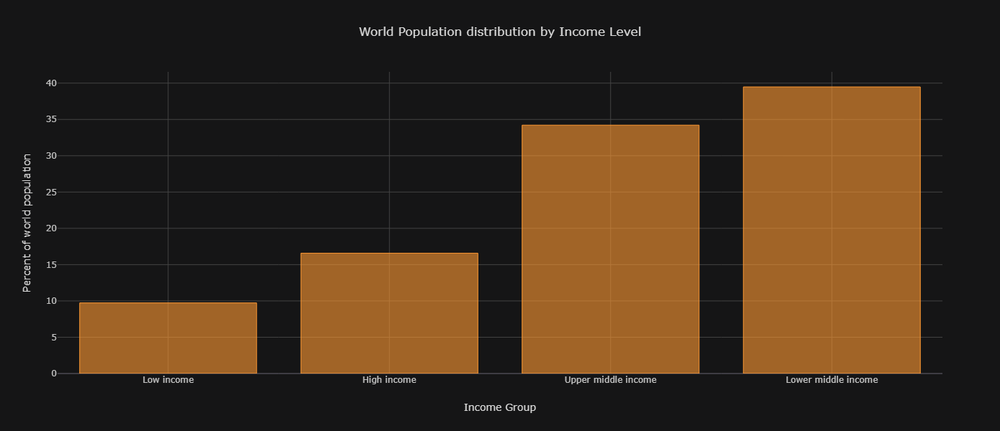

In [416]:
td = df2[df2['Country Name'].isin(country2)]
td = td[td['Year'].isin(['2017'])]
td["pop_percent"] = 100*td['SP.POP.TOTL']/td['SP.POP.TOTL'].sum()
td.sort_values('pop_percent').iplot(kind = 'bar', x= 'Country Name', y= 'pop_percent',dimensions = [1000,600],sortbars = True
                    ,text = 'SP.POP.TOTL', fill = True, xTitle = 'Income Group', yTitle = 'Percent of world population',title = 'World Population distribution by Income Level (Current)')

Only 9%? Shocking isn't it. Yes only 9% of people in the world are living in low income countries today.

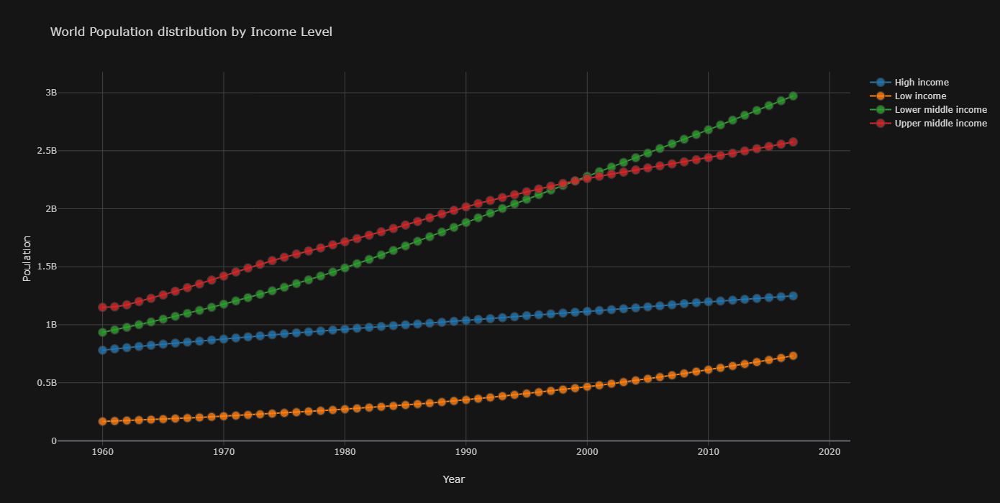

In [103]:
td = df2[df2['Country Name'].isin(country2)]
td.iplot(kind = 'scatter', x= 'Year', y= 'SP.POP.TOTL',dimensions = [1350,700],mode = "markers+lines", categories = "Country Name"
                     , xTitle = 'Year', yTitle = 'Poulation',title = 'World Population distribution by Income Level')

It might seem from above chart that Low Income population is increasing, so the above point doesn't make sense?
But the reason being the population is increasing in only Low Income countries due to high Fertility rate in those countries.

Below chart confirms the above categories by looking at the GDP and GNI. The chart is plotted in log scale so as to better able to view the distribution.

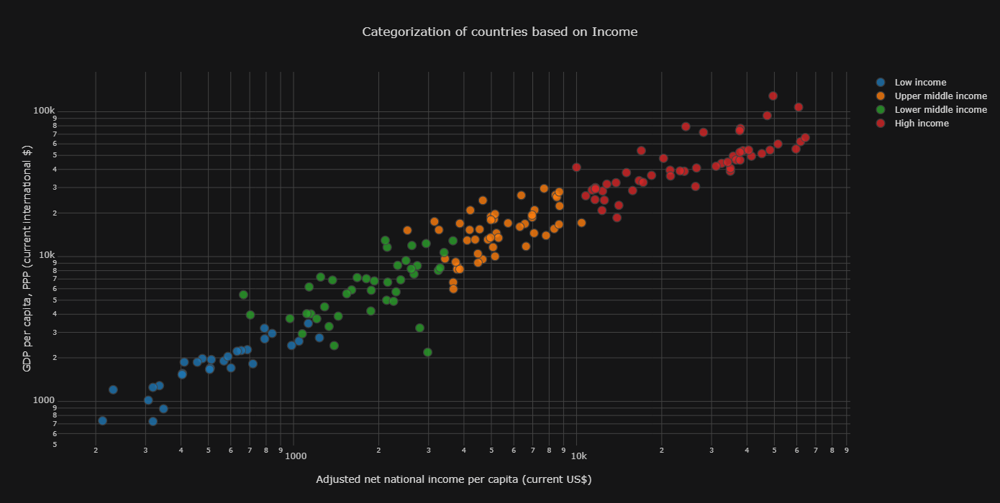

In [55]:
td = df2[df2['Income Group'].notna()]
td = td[td['NY.ADJ.NNTY.PC.CD'].notna()]
td[td['Year'].isin(['2017'])].iplot(kind = 'scatter',x= 'NY.ADJ.NNTY.PC.CD',y = 'NY.GDP.PCAP.PP.CD',text='Country Name', filename='cufflinks/simple-bubble-chart'
                            , dimensions = [1350,700],categories = 'Income Group',logy = True,logx = True, xTitle = 'Adjusted net national income per capita (current US$)'
                            ,yTitle = 'GDP per capita, PPP (current international $)', title='Categorization of countries based on Income')


# Income disparity

There is famous 80:20 rule which is applicable in many cases. One of the examples for it is the income distribution, i.e. 20% of the people hold as much as the other 80%, we will explore that in the below charts. We see the rule being true. And over the time on average it is more or less same.

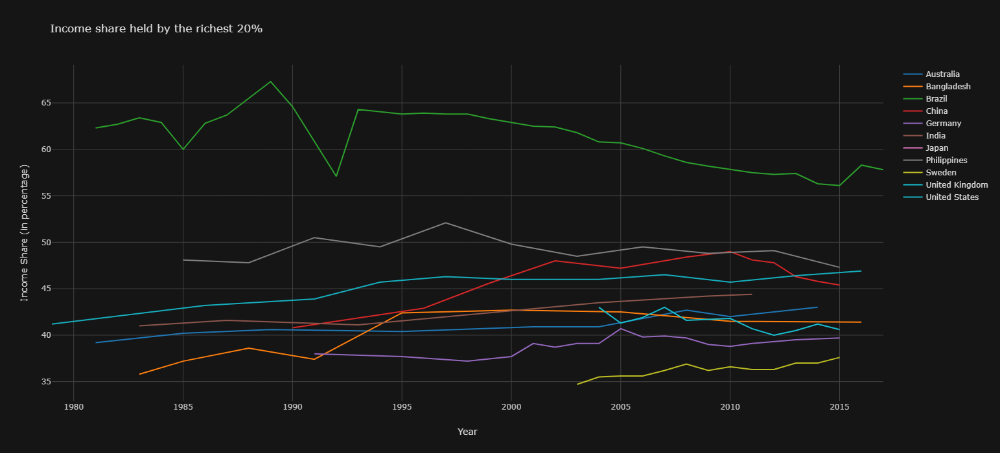

In [119]:
td = df2[df2['Country Name'].isin(country3)]
td = td[td['SI.DST.05TH.20'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SI.DST.05TH.20',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode = 'lines'
          , xTitle = "Year", yTitle = "Income Share (in percentage)", title = "Income share held by the richest 20%")


Let's explore the same for richest 10%

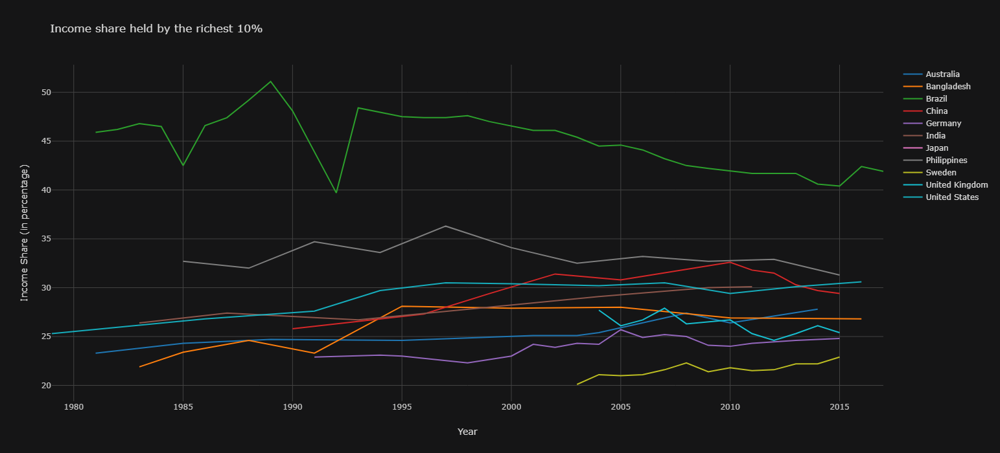

In [118]:
td = df2[df2['Country Name'].isin(country3)]
td = td[td['SI.DST.10TH.10'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SI.DST.10TH.10',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode = 'lines'
        , xTitle = "Year", yTitle = "Income Share (in percentage)", title = "Income share held by the richest 10%")


We see it declining for Brazil which had the most income disparity, which shows the world is not as bad as we see it. Same is the case for UK and China as well. But it is increasing in many cases as well including the US. The conclusion is on avergae things might look bad for everyone, but if we see the data individually, things might be improving for some. But, yes the income disparity is high, but good new

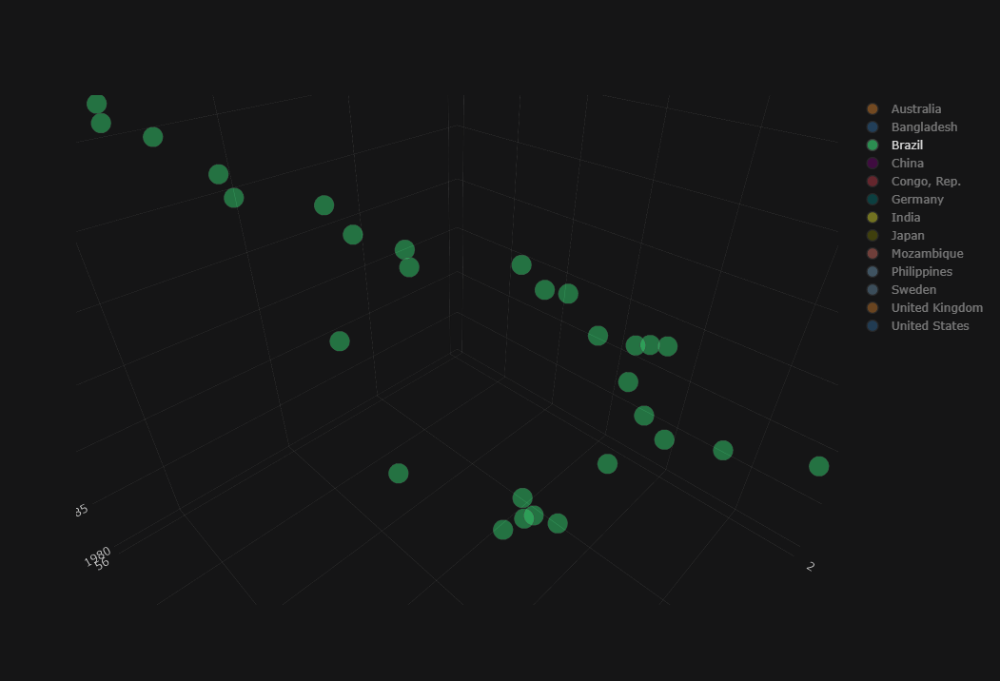

In [490]:
td = df2[df2['Country Name'].isin(country3)]
td = td[td['SI.DST.05TH.20'].notna()]
td.iplot(kind = 'scatter3d',x= 'SI.DST.FRST.20',y = 'SI.DST.05TH.20',z= 'Year',dimensions = [1350,700],categories = 'Country Name',text='Country Name',)


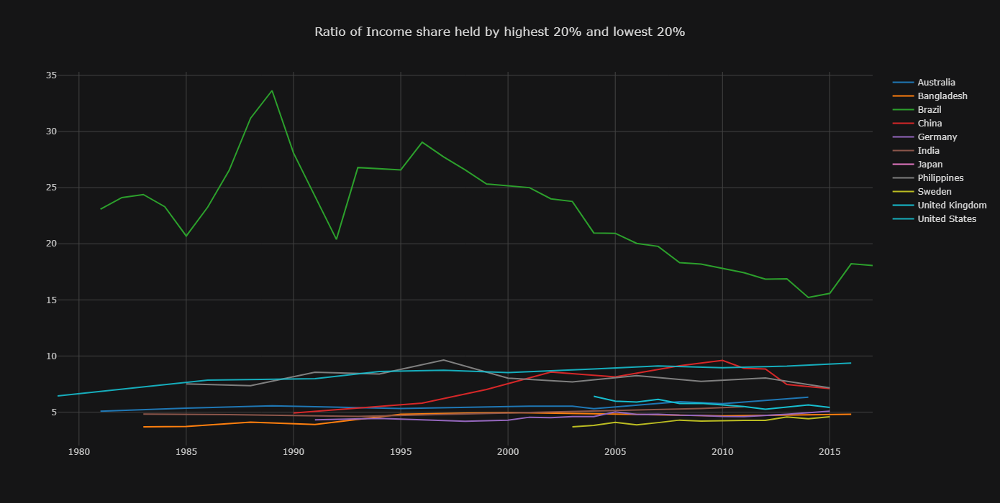

In [179]:
td = df2[df2['Country Name'].isin(country3)]
td = td[td['SI.DST.05TH.20'].notna()]
td = td[td['SI.DST.FRST.20'].notna()]
td['new'] = td['SI.DST.05TH.20']/td['SI.DST.FRST.20']
td.iplot(kind = 'scatter',x= 'Year',y = 'new',dimensions = [1350,700],categories = 'Country Name',text='Country Name', mode = "lines"
        , title = "Ratio of Income share held by highest 20% and lowest 20%")


A more accurate parameter is GINI Index

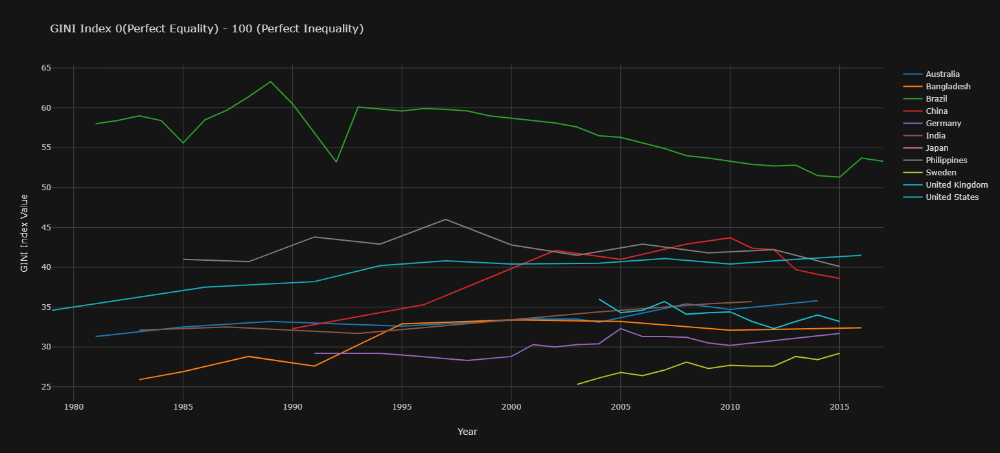

In [123]:
td = df2[df2['Country Name'].isin(country3)]
td = td[td['SI.POV.GINI'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SI.POV.GINI',dimensions = [1350,700],categories = 'Country Name',text='Country Name', mode = "lines"
        , title = "GINI Index 0(Perfect Equality) - 100 (Perfect Inequality)", yTitle = "GINI Index Value", xTitle = "Year")


# Poverty

Let's explore the poverty rates as mentioned in the book.
https://www.investopedia.com/terms/p/poverty-gap.asp

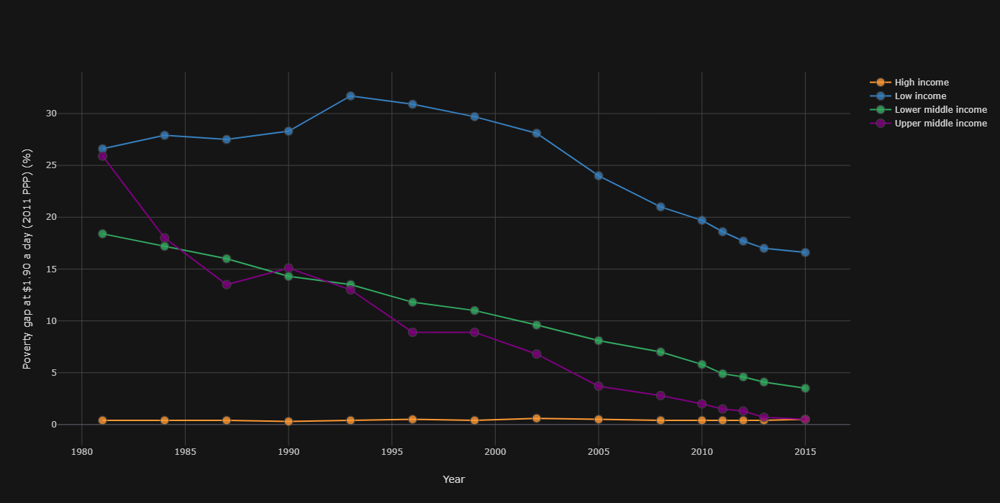

In [504]:
td = df2[df2['Country Name'].isin(country2)]
td = td[td['SI.POV.GAPS'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SI.POV.GAPS',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Poverty gap at $1.90 a day (2011 PPP) (%)')

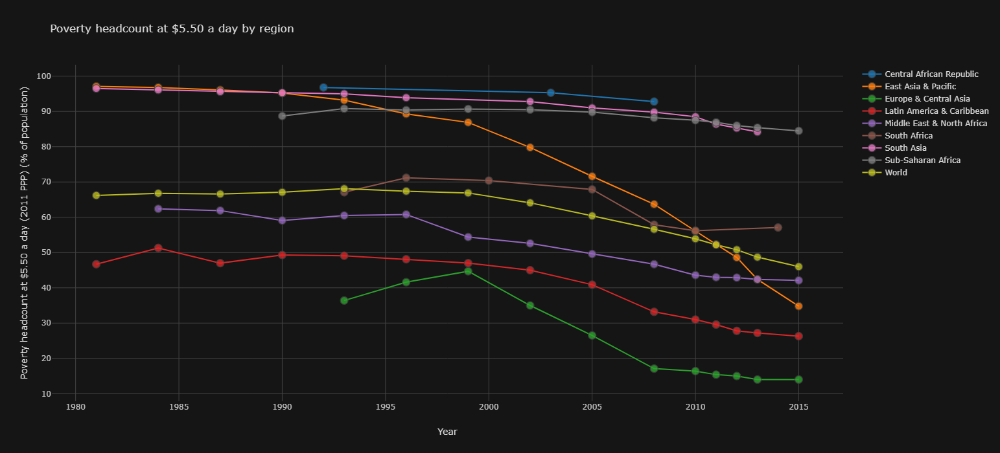

In [276]:
td = df2[df2['Country Name'].isin(country1)]
td = td[td['SI.POV.UMIC'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SI.POV.UMIC',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Poverty headcount at $5.50 a day (2011 PPP) (% of population)', title = "Poverty headcount at $5.50 a day by region")

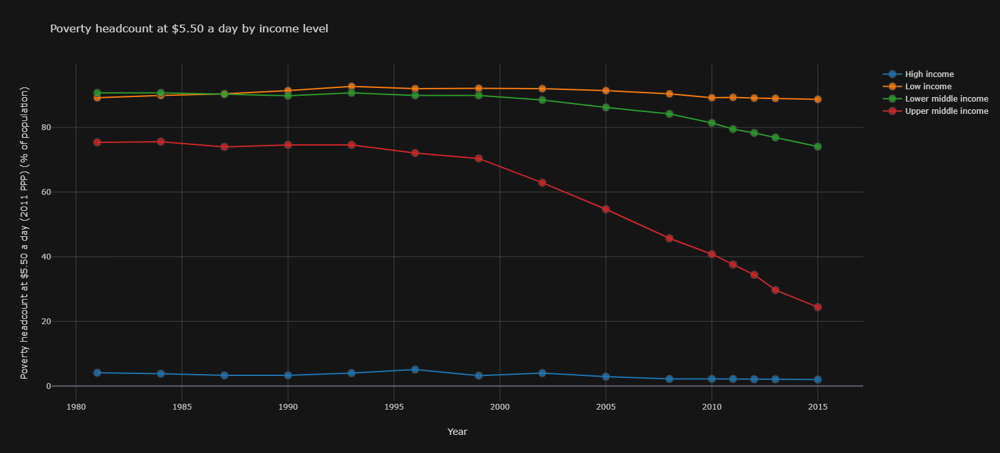

In [277]:
td = df2[df2['Country Name'].isin(country2)]
td = td[td['SI.POV.UMIC'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SI.POV.UMIC',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Poverty headcount at $5.50 a day (2011 PPP) (% of population)', title = "Poverty headcount at $5.50 a day by income level")

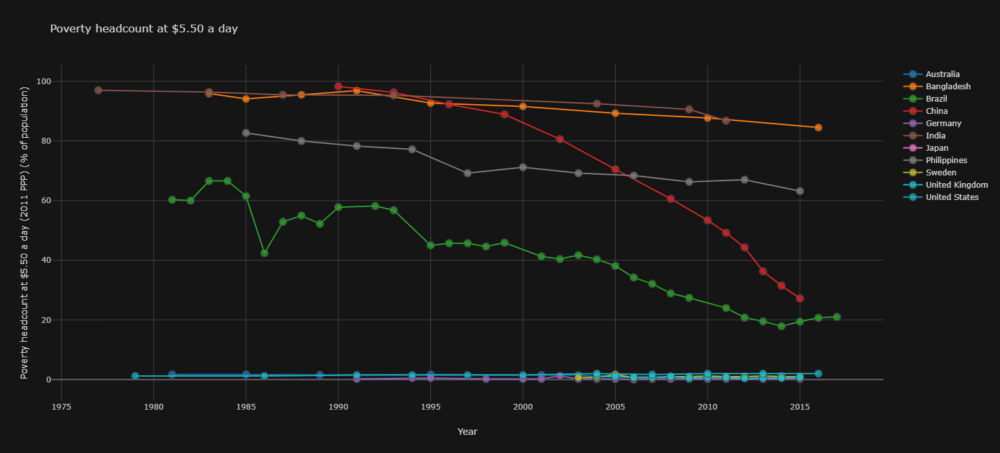

In [273]:
td = df2[df2['Country Name'].isin(country3)]
td = td[td['SI.POV.UMIC'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SI.POV.UMIC',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Poverty headcount at $5.50 a day (2011 PPP) (% of population)', title = "Poverty headcount at $5.50 a day")

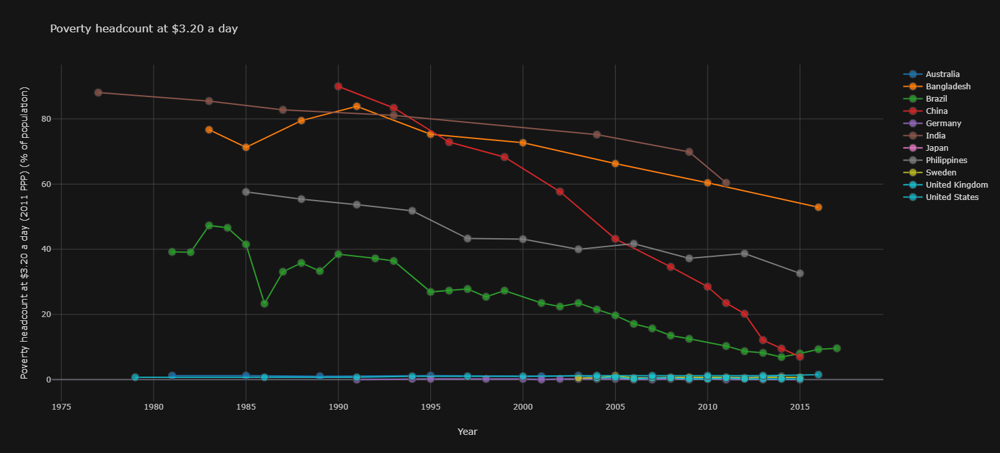

In [271]:
td = df2[df2['Country Name'].isin(country3)]
td = td[td['SI.POV.LMIC'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SI.POV.LMIC',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Poverty headcount at $3.20 a day (2011 PPP) (% of population)', title = "Poverty headcount at $3.20 a day")

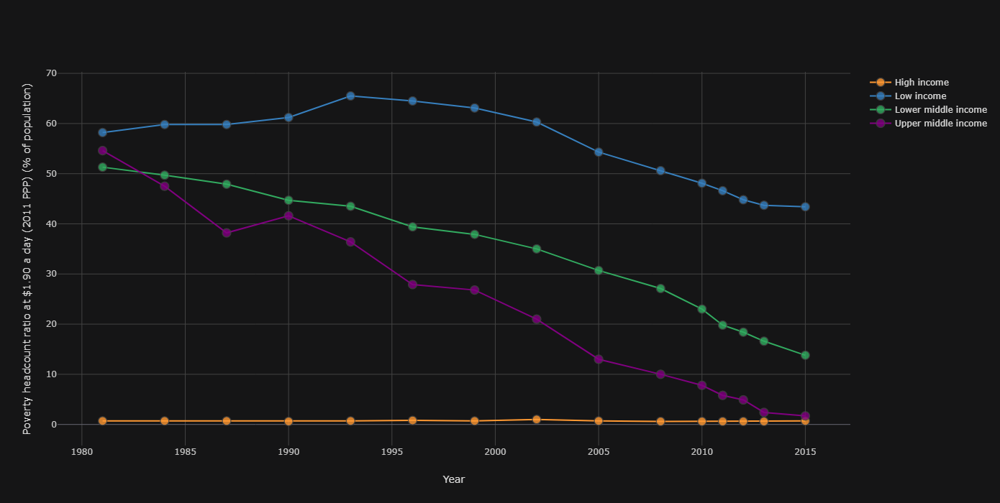

In [507]:
td = df2[df2['Country Name'].isin(country2)]
td = td[td['SI.POV.DDAY'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SI.POV.DDAY',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Poverty headcount ratio at $1.90 a day (2011 PPP) (% of population)')


Apart from showing that the poverty GAP is decreasing, this also shows that if we look at 1980, there were only two categories rich and poor, but the distinction among 4 poverty levels have become significant over the time.

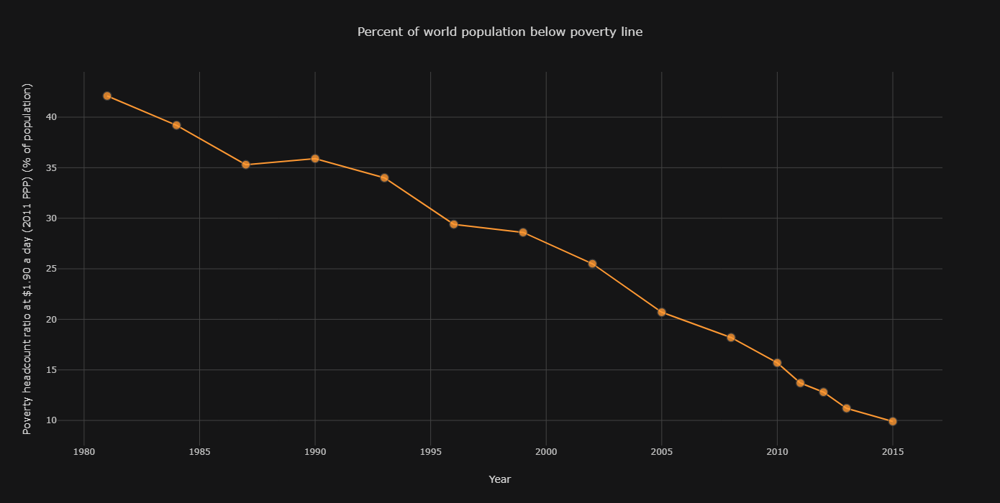

In [568]:
td = df2[df2['Country Name'].isin(["World"])]
td = td[td['SI.POV.DDAY'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SI.POV.DDAY',dimensions = [1350,700],mode='lines+markers', categories = "Country Name"
        ,xTitle = "Year", yTitle = 'Poverty headcount ratio at $1.90 a day (2011 PPP) (% of population)',title = 'Percent of world population below poverty line')


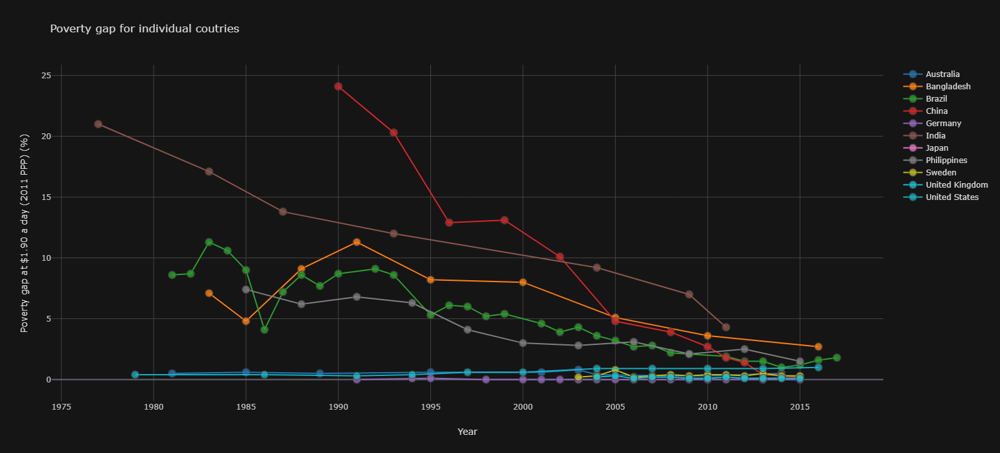

In [124]:
td = df2[df2['Country Name'].isin(country3)]
td = td[td['SI.POV.GAPS'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SI.POV.GAPS',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Poverty gap at $1.90 a day (2011 PPP) (%)', title = "Poverty gap for individual coutries")

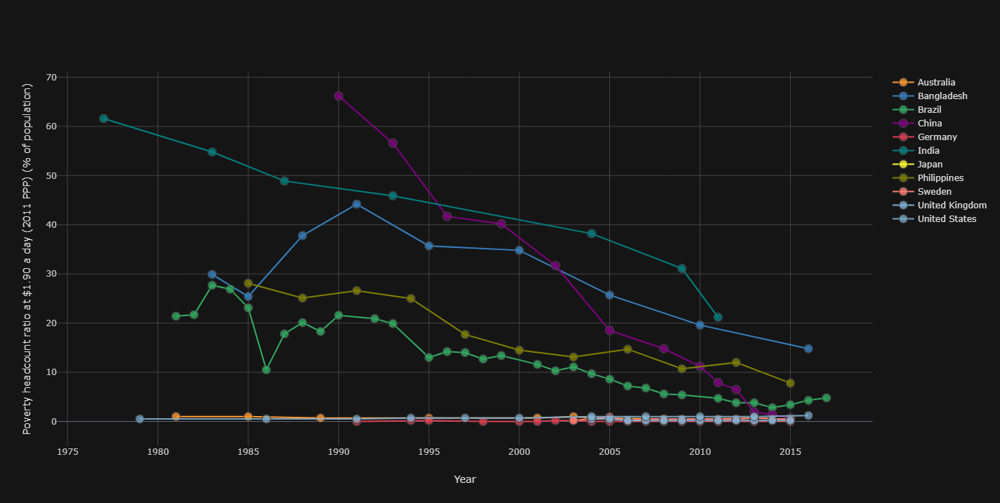

In [530]:
td = df2[df2['Country Name'].isin(country3)]
td = td[td['SI.POV.DDAY'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SI.POV.DDAY',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Poverty headcount ratio at $1.90 a day (2011 PPP) (% of population)')


<h1>Let's now look at Life Expectancy

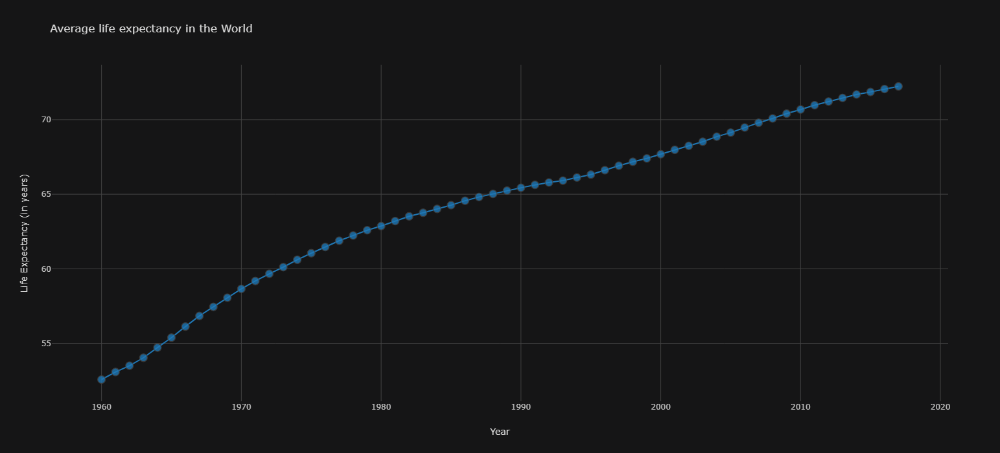

In [139]:
td = df2[df2['Country Name'].isin(['World'])]
td = td[td['SP.DYN.LE00.IN'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SP.DYN.LE00.IN',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Life Expectancy (in years)', title = "Average life expectancy in the World")


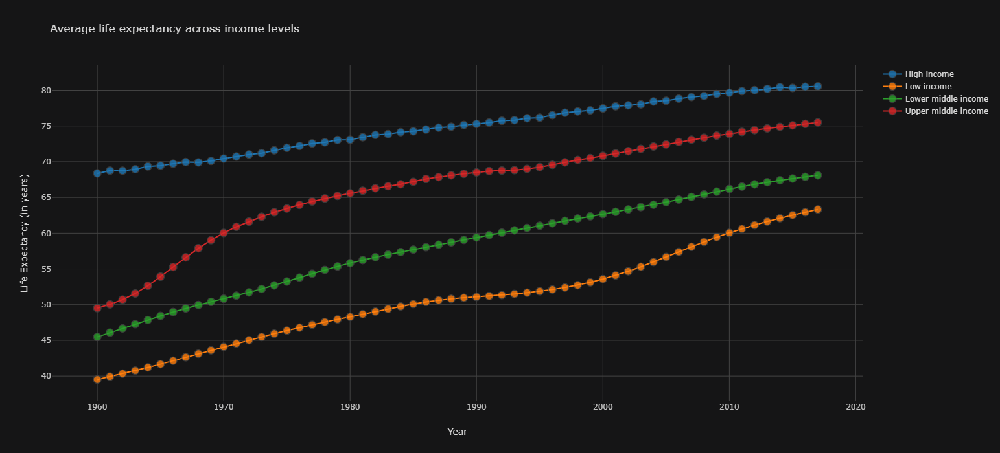

In [140]:
td = df2[df2['Country Name'].isin(country2)]
td = td[td['SP.DYN.LE00.IN'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SP.DYN.LE00.IN',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Life Expectancy (in years)', title = "Average life expectancy across income levels")

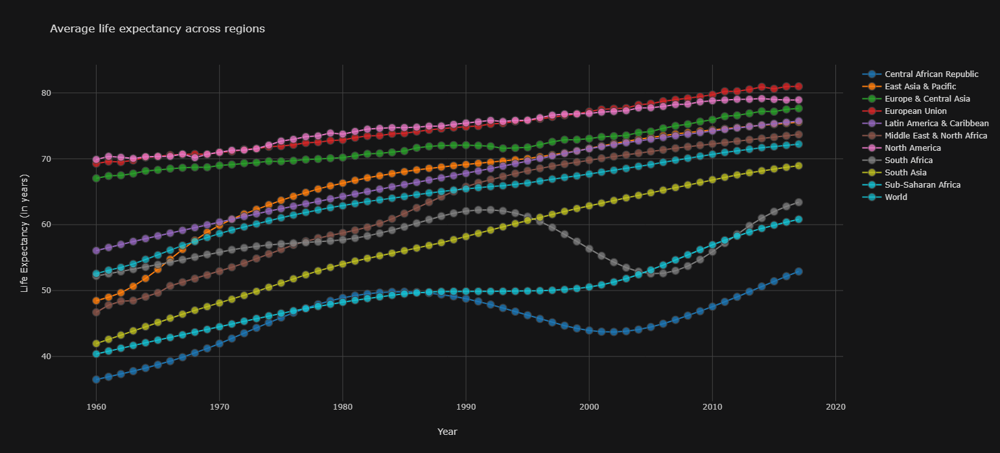

In [141]:
td = df2[df2['Country Name'].isin(country1)]
td = td[td['SP.DYN.LE00.IN'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SP.DYN.LE00.IN',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Life Expectancy (in years)', title = "Average life expectancy across regions")


We see that life expectancy has been continously increasing, that's good news. This means every place on earth has been continually developing and increasing it's living standards. More people are moving from Level 1 to Level 2 and Level 3, and are able escape extreme poverty. They are able to get better nutrition and health care facilities.

# Energy and emission

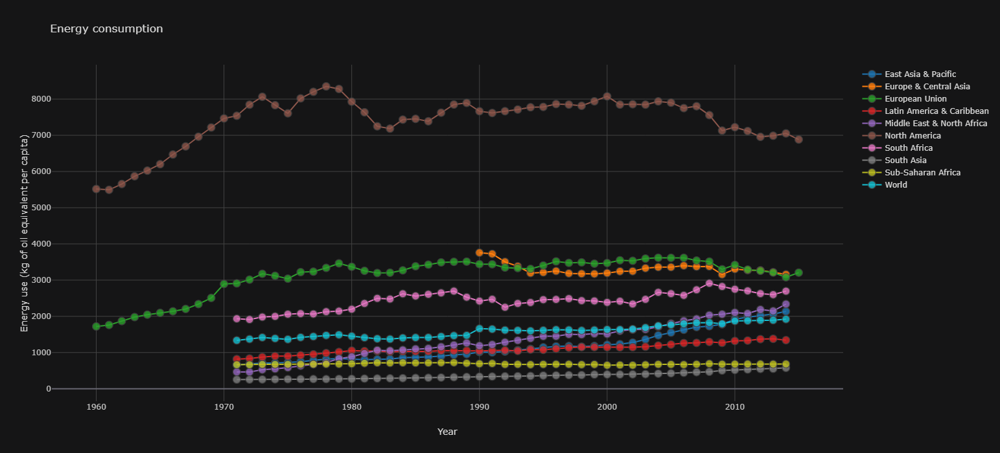

In [243]:
td = df2[df2['Country Name'].isin(country1)]
td = td[td['EG.USE.PCAP.KG.OE'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'EG.USE.PCAP.KG.OE',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Energy use (kg of oil equivalent per capita)', title = "Energy consumption")


The above chart shows that North America has the highest per capita energy consumption. This is the answer to all those people who say that countries like China and India are increasingly constributing to global emissions, one thing they miss is that these countries account for the 40% of world population, and if we look at per capita numbers, the picture seems more clearer.

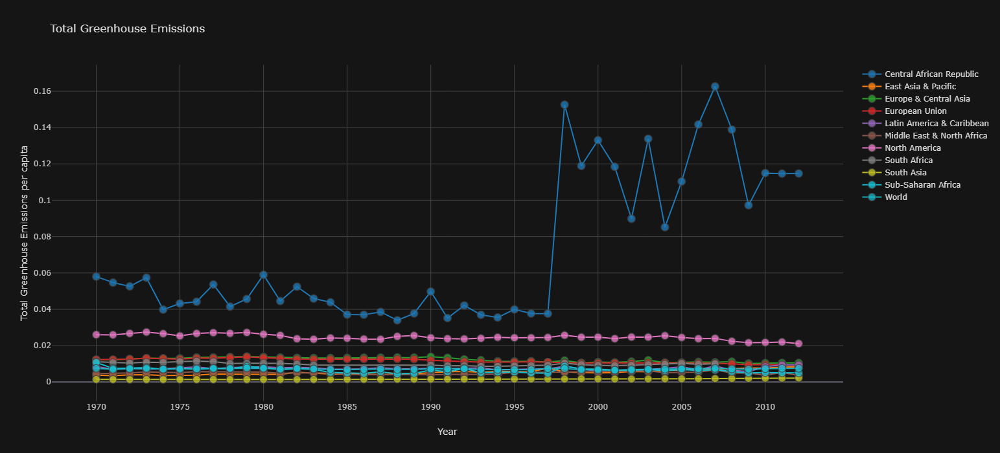

In [258]:
td = df2[df2['Country Name'].isin(country1)]
td["per_capita_emission"] = td['EN.ATM.GHGT.KT.CE']/td["SP.POP.TOTL"]
td = td[td['per_capita_emission'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'per_capita_emission',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Total Greenhouse Emissions per capita', title = "Total Greenhouse Emissions")

# Population

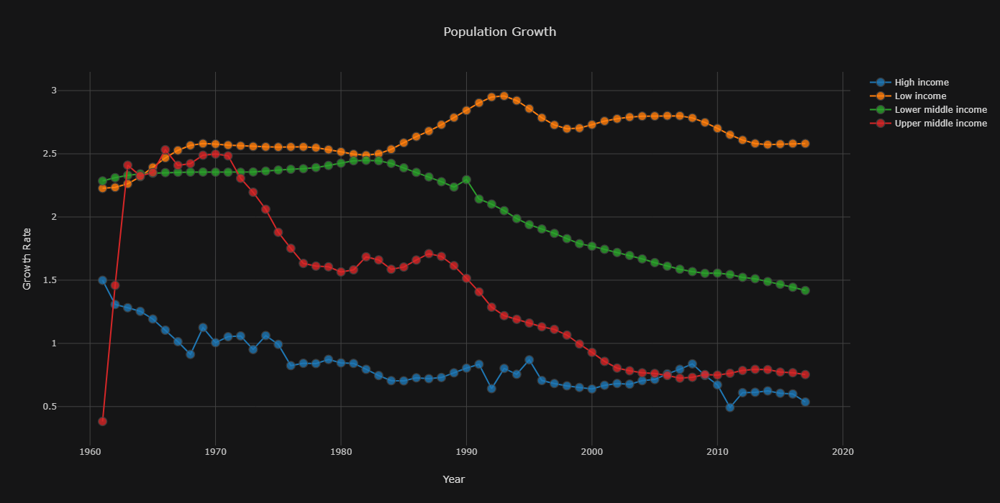

In [103]:
td = df2[df2['Country Name'].isin(country2)]
td = td[td['SP.POP.GROW'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'SP.POP.GROW',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Growth Rate', title = "Population Growth")


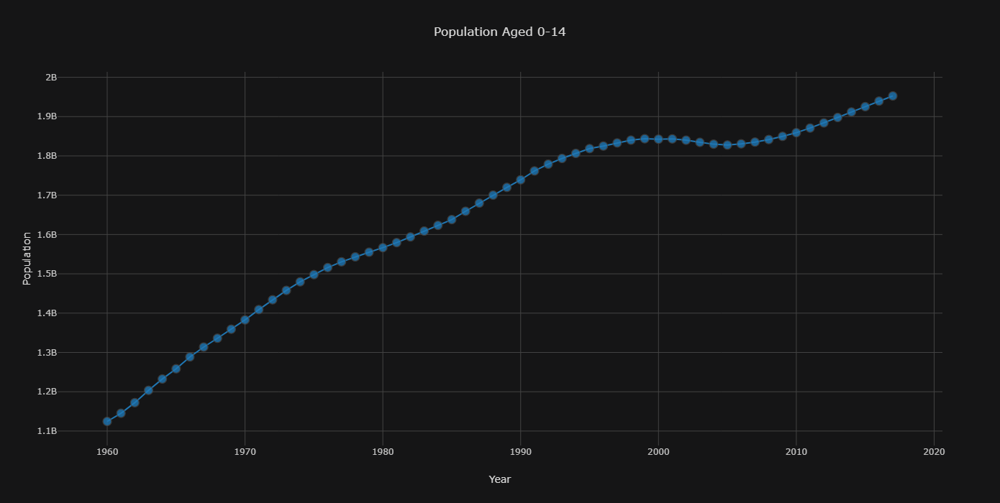

In [177]:
td = df2[df2['Country Name'].isin(["World"])]
variable = "SP.POP.0014.TO"
td = td[td[variable].notna()]
fig1 = td.iplot(kind = 'scatter',x= 'Year',y = variable,dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle = 'Population', title = "Population Aged 0-14", asFigure=True).to_plotly_json()
cf.iplot(fig1)

Looking at this one might wonder that the population of young people is going to continually decrease. But that isn't the case, as per UN predictions, the younger population will remain at 2 Billion till the year 2100. That might be hard to digest, but this is due to the decrease in fertility rates, and every year equal number of children age to 15 as the number of children born.

In [43]:
pop = pd.read_csv("population_total.csv")

In [44]:
total = pop.apply(np.sum)
total['country'] = 'World'
pop = pop.append(pd.DataFrame(total.values, index=total.keys()).T, ignore_index=True)

In [45]:
pop = pop.melt(id_vars="country",var_name = "year",value_name="population")

In [80]:
pop["year"] = pd.to_numeric(pop["year"])

In [84]:
pop.loc[(pop["country"]=="World") & (pop["year"] > 2017),'country'] = 'World (Predicted)'

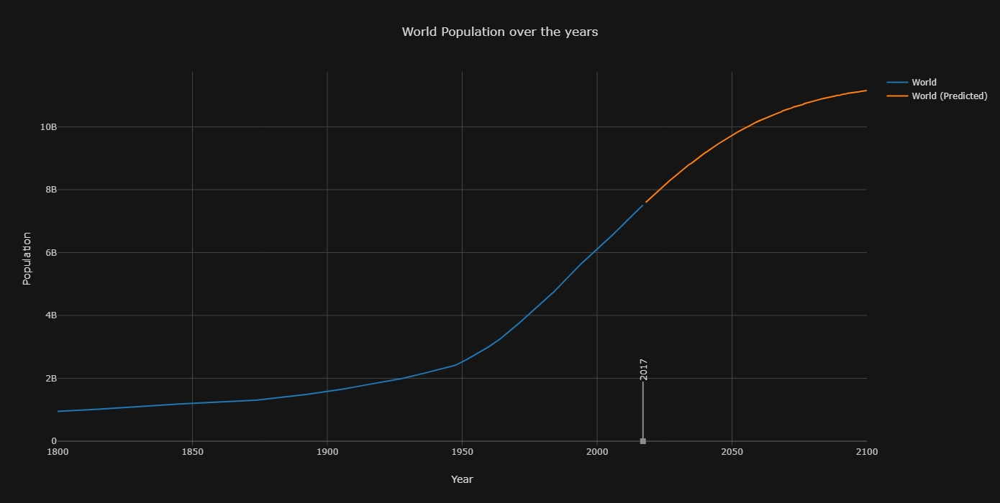

In [106]:
pop[pop["country"].isin(["World","World (Predicted)"])].iplot(kind = "scatter",x = "year", y = "population", categories = "country",dimensions = [1350,700], text = "country"
                             , xTitle = "Year", yTitle = "Population", title = "World Population over the years", annotations = {'2017' : "2017"}
                             ,mode ="lines")

Now we look at the average fertility rate

In [154]:
cpw = pd.read_csv("children_per_woman_total_fertility_with_projections.csv")

In [ ]:
total = cpw.loc[:,cpw.columns!='country'].apply(np.nanmean)
total['country'] = 'World'
cpw = cpw.append(pd.DataFrame(total.values, index=total.keys()).T, ignore_index=True)

In [156]:
cpw = cpw.melt(id_vars="country",var_name = "year",value_name="fertility")

In [157]:
cpw["year"] = pd.to_numeric(cpw["year"])

In [158]:
cpw.loc[(cpw["country"]=="World") & (cpw["year"] > 2017),'country'] = 'World (Predicted)'

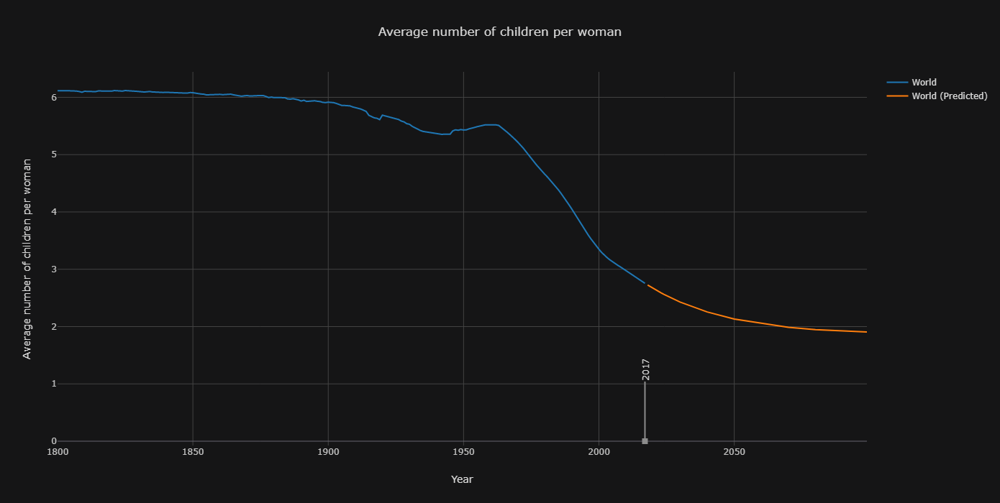

In [163]:
cpw = cpw.query("year>=1800")
cpw = cpw.dropna()
cpw[cpw["country"].isin(["World","World (Predicted)"])].iplot(kind = "scatter",x = "year", y = "fertility", categories = "country",dimensions = [1350,700], text = "country"
                             , xTitle = "Year", yTitle = "Average number of children per woman", title = "Average number of children per woman", annotations = {'2017' : "2017"}
                             ,mode ="lines",  )

In [ ]:
td.iplot()

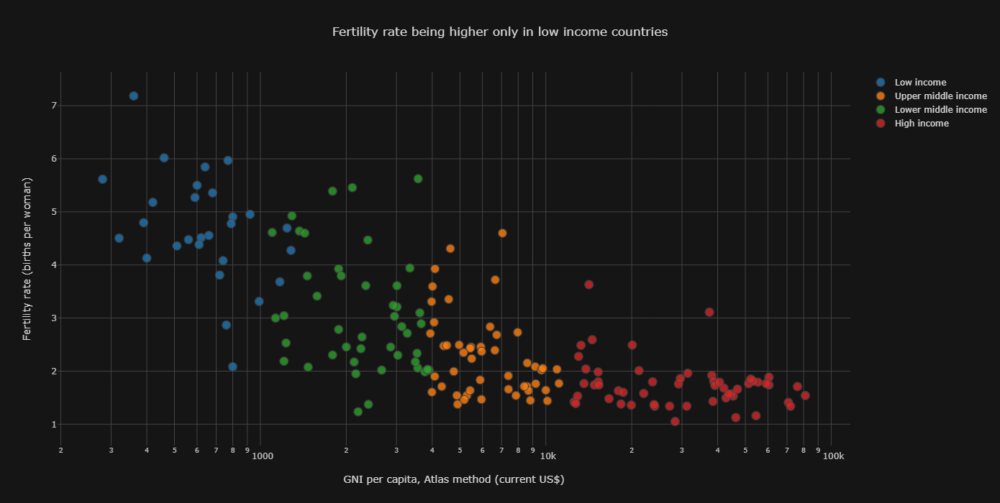

In [197]:
td = df2[df2['Income Group'].notna()]
td = td[td['SP.DYN.TFRT.IN'].notna()]
td[td['Year'].isin(['2017'])].iplot(kind = 'scatter',y= 'SP.DYN.TFRT.IN',x='NY.GNP.PCAP.CD',text='Country Name'
             ,yTitle='Fertility rate (births per woman)', xTitle='GNI per capita, Atlas method (current US$)'
             , dimensions = [1350,700],categories = 'Income Group', title = "Fertility rate being higher only in low income countries"
             , logx = True )

This shows that as countries move away from extreme poverty (Low Income Category), there are fewer babies per women.

In [142]:
celd = pd.read_csv("children_and_elderly_per_100_adults.csv")

In [143]:
total = celd.loc[:,celd.columns!='country'].apply(np.nanmean)
total['country'] = 'World'
celd = celd.append(pd.DataFrame(total.values, index=total.keys()).T, ignore_index=True)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




In [144]:
celd = celd.melt(id_vars="country",var_name = "year",value_name="fertility")

In [145]:
celd["year"] = pd.to_numeric(celd["year"])

In [147]:
celd.loc[(celd["country"]=="World") & (celd["year"] > 2017),'country'] = 'World (Predicted)'

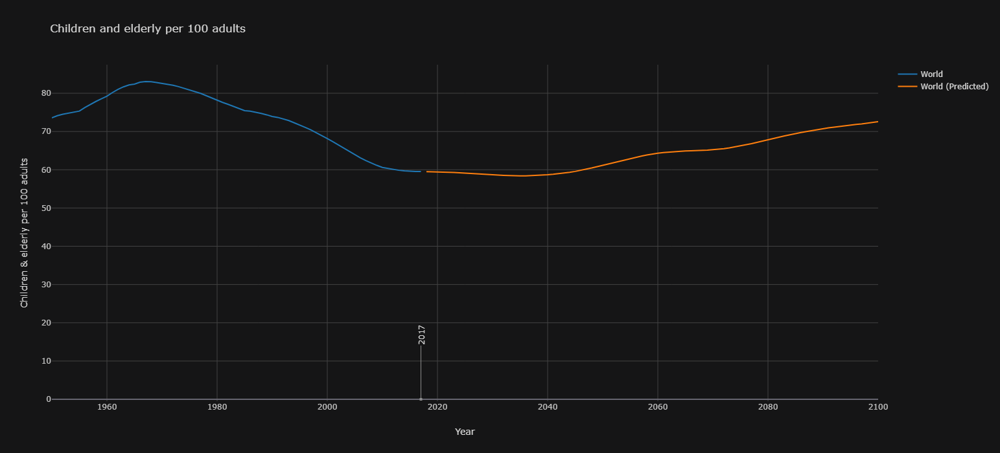

In [149]:
celd = celd.query("year>=1800")
celd = celd.dropna()
celd[celd["country"].isin(["World","World (Predicted)"])].iplot(kind = "scatter",x = "year", y = "fertility", categories = "country",dimensions = [1350,700], text = "country"
                             , xTitle = "Year", yTitle = "Children & elderly per 100 adults", title = "Children and elderly per 100 adults", annotations = {'2017' : "2017"}
                             ,mode ="lines"   )

<h1> Access to electricity

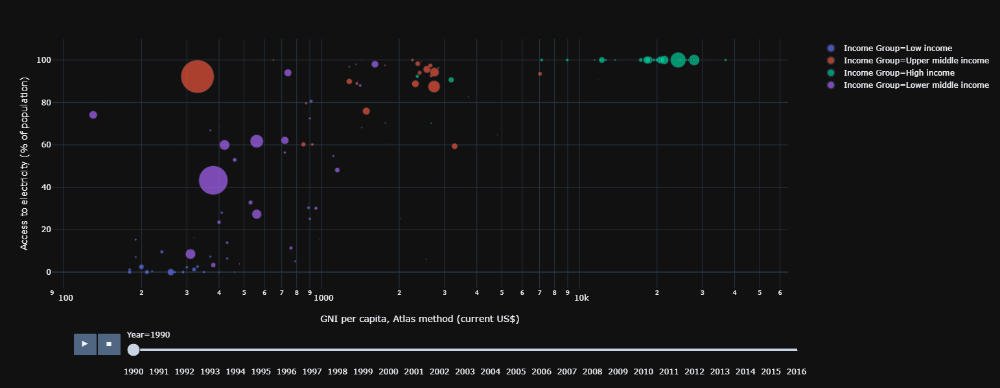

In [224]:
td = df2[df2['Income Group'].notna()]
# td = df2[df2['Country Name'].isin(country3)]
td = td[td['EG.ELC.ACCS.ZS'].notna()]
td = td[td['SP.POP.TOTL'].notna()]
px.scatter(td,y= 'EG.ELC.ACCS.ZS',x='NY.GNP.PCAP.CD',size = "SP.POP.TOTL", color = "Income Group",log_x=True, template="plotly_dark"
         ,hover_data=["Country Name"], labels={'EG.ELC.ACCS.ZS':'Access to electricity (% of population)','NY.GNP.PCAP.CD':'GNI per capita, Atlas method (current US$)'
          , "SP.POP.TOTL":"population"}, size_max=40,animation_frame="Year")

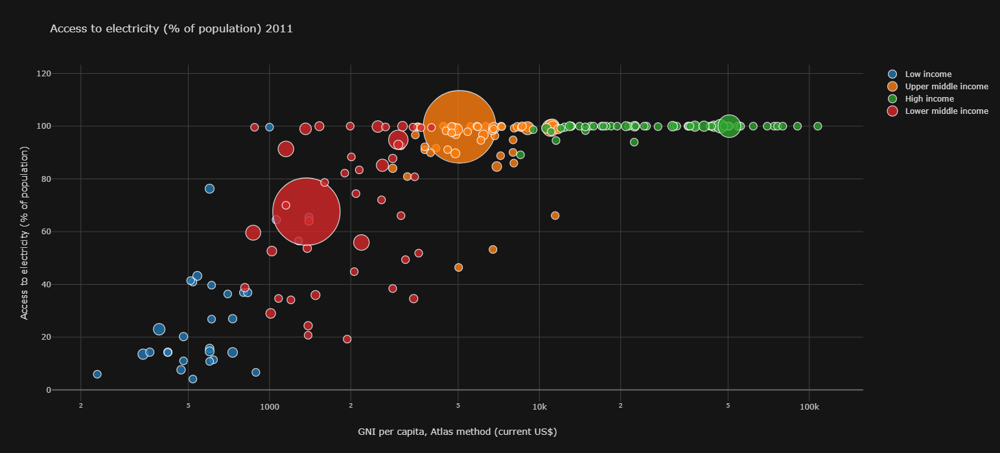

In [240]:
td = df2[df2['Income Group'].notna()]
td = td[td['EG.ELC.ACCS.ZS'].notna()]
td[td['Year'].isin(['2011'])].iplot(kind = 'bubble',y= 'EG.ELC.ACCS.ZS',x='NY.GNP.PCAP.CD',size = "SP.POP.TOTL" ,text='Country Name'
             ,yTitle='Access to electricity (% of population)', xTitle='GNI per capita, Atlas method (current US$)'
             , dimensions = [1350,700],categories = 'Income Group', title = "Access to electricity (% of population) 2011"
             , logx = True )

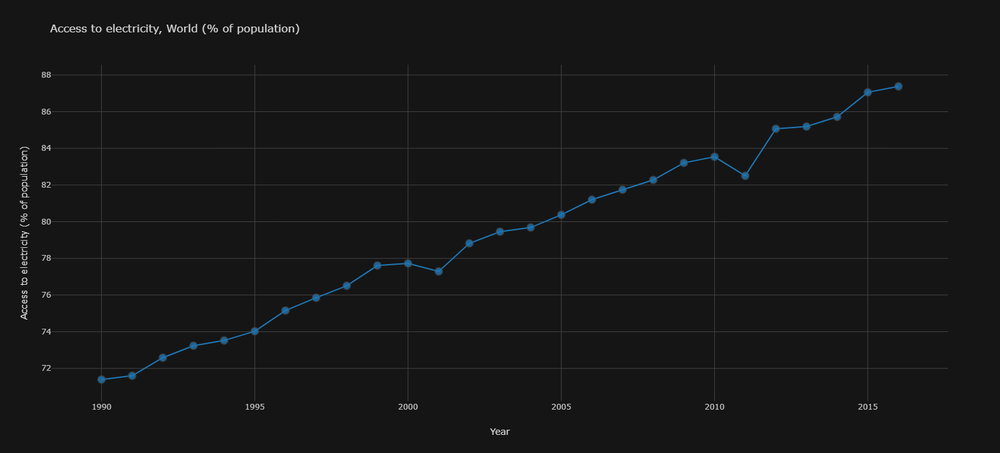

In [228]:
td = df2[df2['Country Name'].isin(["World"])]
td = td[td['EG.ELC.ACCS.ZS'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'EG.ELC.ACCS.ZS',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle='Access to electricity (% of population)', title = "Access to electricity, World (% of population)")


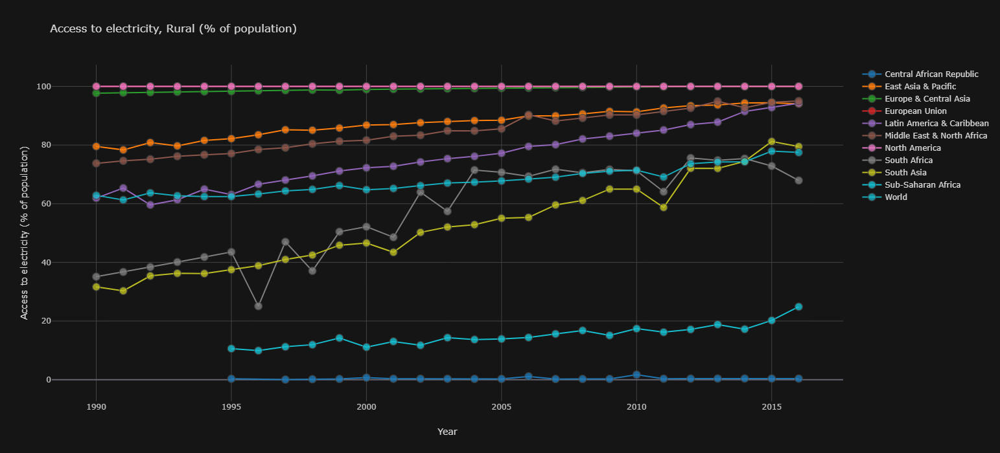

In [241]:
td = df2[df2['Country Name'].isin(country1)]
td = td[td['EG.ELC.ACCS.RU.ZS'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'EG.ELC.ACCS.RU.ZS',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle='Access to electricity (% of population)', title = "Access to electricity, Rural (% of population)")

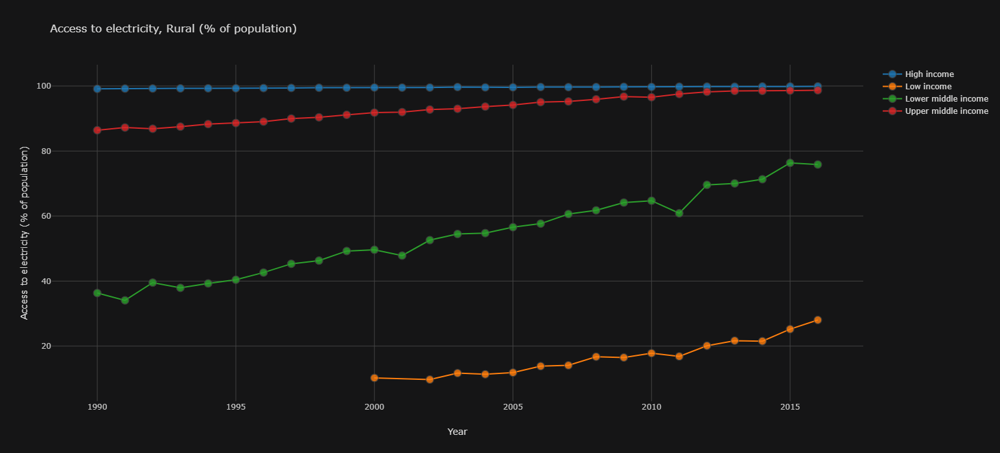

In [239]:
td = df2[df2['Country Name'].isin(country2)]
td = td[td['EG.ELC.ACCS.RU.ZS'].notna()]
td.iplot(kind = 'scatter',x= 'Year',y = 'EG.ELC.ACCS.RU.ZS',dimensions = [1350,700],categories = 'Country Name',text='Country Name',mode='markers+lines'
        ,xTitle = "Year", yTitle='Access to electricity (% of population)', title = "Access to electricity, Rural (% of population)")